In [1]:
import numpy as np
import os
import cv2
from matplotlib import pyplot as plt
from IPython.display import clear_output
from keras.layers import Input
INPUT_TENSOR = Input(shape=(480, 320, 3))
#wf
import tkinter as tk
from tkinter import filedialog, ttk, messagebox
from PIL import Image, ImageTk
from pathlib import Path
import threading
import json

In [2]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="Dgum62rohMlHUx3VGpUa")
project = rf.workspace("computer-vision-project-n6sop").project("stbr-i80wj")
version = project.version(2)
dataset = version.download("folder")


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.8/86.8 kB 4.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 3.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 12.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.2/4.2 MB 29.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.9/4.9 MB 28.7 MB/s eta 0:00:00
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.11.0.86
    Uninstalling opencv-python-headless-4.11.0.86:
      Successfully uninstalled opencv-python-headless-4.11.0.86
  Attempting uninstall: idna
    Found existing installation: idna 3.10
    Uninstalling idna-3.10:
      Successfully uninstalled idna-3.10


loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to stbr-2 in folder:: 100%|██████████| 903/903 [00:00<00:00, 9139.92it/s]


# Select Model as Feature Extractor

In [3]:
# Load the feature extractor model
from tensorflow.keras.applications.mobilenet_v2 import MobileNetV2, preprocess_input

model_name = "MobileNetV2"
model = MobileNetV2(
    input_shape=(224, 224, 3),
    include_top=False,
    weights='imagenet'
)


9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


# Distance Similarity Measures

In [4]:
# Measure the feature similarity
from sklearn.metrics.pairwise import euclidean_distances
from sklearn.metrics.pairwise import manhattan_distances
from sklearn.metrics.pairwise import cosine_distances
from sklearn.metrics.pairwise import pairwise_distances

def euclidean(features1, features2):
    distance = euclidean_distances([features1], [features2])
    return distance[0][0]

def manhattan(features1, features2):
    distance = manhattan_distances([features1], [features2])
    return distance[0][0]

def cosine(features1, features2):
    distance = cosine_distances([features1], [features2])
    return distance[0][0]

def minkowski(features1, features2):
    distance = pairwise_distances([features1], [features2], metric='minkowski', p=3)
    return distance[0][0]

In [5]:
# Extract the image features

DIMS = (224, 224)  # (width, height)


def extract_features(image_path):
    img = cv2.imread(image_path)
    if img is None:
        print(f"Failed to load image: {image_path}")
        return None  # atau bisa raise Exception jika ingin keras
    img = cv2.resize(img, DIMS)
    filtered = cv2.bilateralFilter(img, 9, 150, 150)
    img = np.expand_dims(filtered, axis=0)
    img = preprocess_input(img)
    features = model.predict(img)
    return features.flatten()

# Extract Images Features

In [6]:
IMG_DATABASE = "/content/stbr-2"


file_path = []
for dirname, _, filenames in os.walk(IMG_DATABASE):
    for filename in filenames:
        file_path.append(os.path.join(dirname, filename))

In [7]:
features = []
for file in file_path:
    print("Extracting features from", file)
    feature = extract_features(file)
    if feature is not None:
        features.append(feature)
    else:
        print("Skipping file:", file)
    clear_output(wait=True)
    features.append(feature)
    clear_output(wait=True)

Extracting features from /content/stbr-2/test/Healthy/Copy-of-20250226_115106_jpg.rf.cd16e25755f0fa840ea55ddb357672d7.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


In [8]:
features = []
valid_paths = []

for file in file_path:
    feature = extract_features(file)
    if feature is not None:
        features.append(feature)
        valid_paths.append(file)
    else:
        print(f"❌ Ekstraksi gagal untuk: {file}")


Failed to load image: /content/stbr-2/README.dataset.txt
❌ Ekstraksi gagal untuk: /content/stbr-2/README.dataset.txt
Failed to load image: /content/stbr-2/README.roboflow.txt
❌ Ekstraksi gagal untuk: /content/stbr-2/README.roboflow.txt
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 

# Return Similar Images

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step


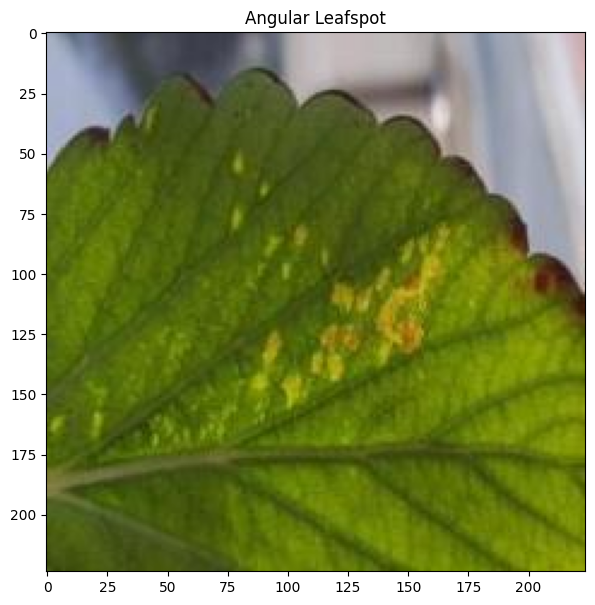

In [9]:
IMG_QUERY = '/content/stbr-2/test/Angular Leafspot/angular_leafspot106_jpg.rf.6326a59db65a1ce2454f2781f93d6fed.jpg'
query_label = IMG_QUERY.split("/")[-2]
query_features = extract_features(IMG_QUERY)
d
plt.figure(figsize=(7,7))
plt.imshow(plt.imread(IMG_QUERY))
plt.title(query_label)
# plt.axis('off')
plt.show()

In [10]:
if query_features is None:
    print("❌ Gagal ekstrak fitur dari query image!")
else:
    print("query_features shape:", query_features.shape)



query_features shape: (62720,)


In [18]:
from scipy.spatial.distance import euclidean
import numpy as np # Make sure numpy is imported for np.mean

result_euclidean = []
# Use valid_paths instead of file_path as it corresponds to the features list
for i in range(len(features)):
    distance = euclidean(query_features, features[i])
    result_euclidean.append((distance, valid_paths[i])) # Use valid_paths here

result_euclidean = sorted(result_euclidean)

precision = []
hit = 0
i = 1
for distance, file_path_item in result_euclidean: # Renamed 'file' to 'file_path_item' to avoid conflict
    # Corrected the split character from '\\' to '/'
    label = file_path_item.split("/")[3] # Adjust index based on your path structure
    if query_label.lower() == label.lower():
        hit += 1
        precision.append(hit/i)
    # print(f"{distance:.2f} | {label}")
    i += 1
print(f"\nEuclidean Average Precision: {np.mean(precision):.3f}")


Euclidean Average Precision: nan


Mean of empty slice.
invalid value encountered in scalar divide


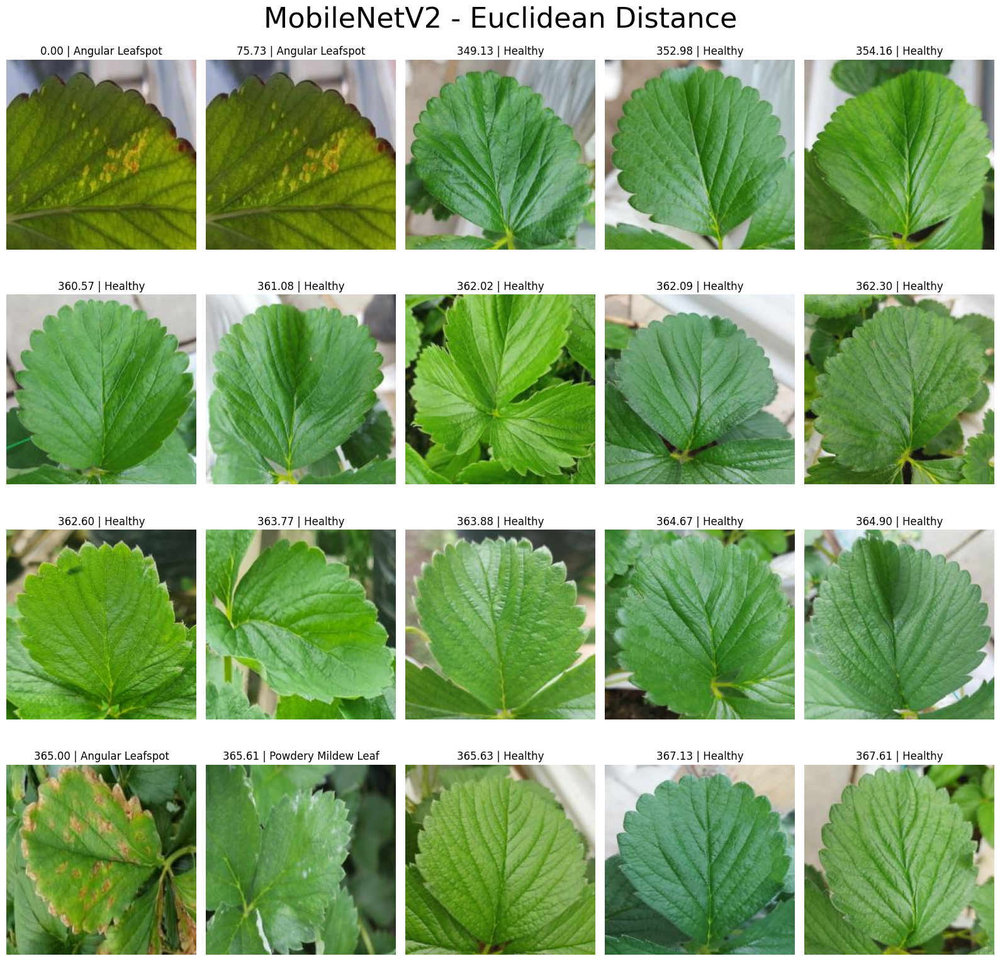

In [19]:
import matplotlib.pyplot as plt
import os

plt.figure(figsize=(16, 16))
for i in range(min(20, len(result_euclidean))):  # jaga-jaga kalau hasil < 20
    distance = result_euclidean[i][0]
    label = os.path.basename(os.path.dirname(result_euclidean[i][1]))

    plt.subplot(4, 5, i + 1)
    plt.title(f"{distance:.2f} | {label}")
    plt.imshow(plt.imread(result_euclidean[i][1]))
    plt.axis("off")

plt.suptitle(f"{model_name} - Euclidean Distance", fontsize=32)
plt.tight_layout()
plt.show()


In [23]:
from scipy.spatial.distance import cityblock # Make sure this is imported
import numpy as np # Make sure numpy is imported for np.mean

result_manhattan = []
# Use valid_paths instead of file_path, as valid_paths directly corresponds to features
for i in range(len(features)):
    # Flatten the features if they are not already 1D, as 'manhattan' expects 1D arrays
    distance = manhattan(query_features.flatten(), features[i].flatten())
    result_manhattan.append((distance, valid_paths[i])) # Use valid_paths here

result_manhattan = sorted(result_manhattan)

precision = []
hit = 0
i = 1
for distance, file_path_item in result_manhattan: # Renamed 'file' to 'file_path_item'
    # Corrected the split character from '\\' to '/'
    # Adjust index (e.g., [3] or [2]) based on your actual path structure to get the label
    try:
        label = file_path_item.split("/")[3] # Example index, adjust as per your paths
    except IndexError:
        label = "Unknown Label" # Fallback if splitting fails
        print(f"Warning: Could not extract label from path: {file_path_item}")

    if query_label.lower() == label.lower():
        hit += 1
        # The common practice for precision is hit/i, not hit/(i+1)
        precision.append(hit/i)
    # print(f"{distance:.2f} | {label}")
    i += 1
print(f"\nManhattan Average Precision: {np.mean(precision):.3f}")


Manhattan Average Precision: nan


Mean of empty slice.
invalid value encountered in scalar divide


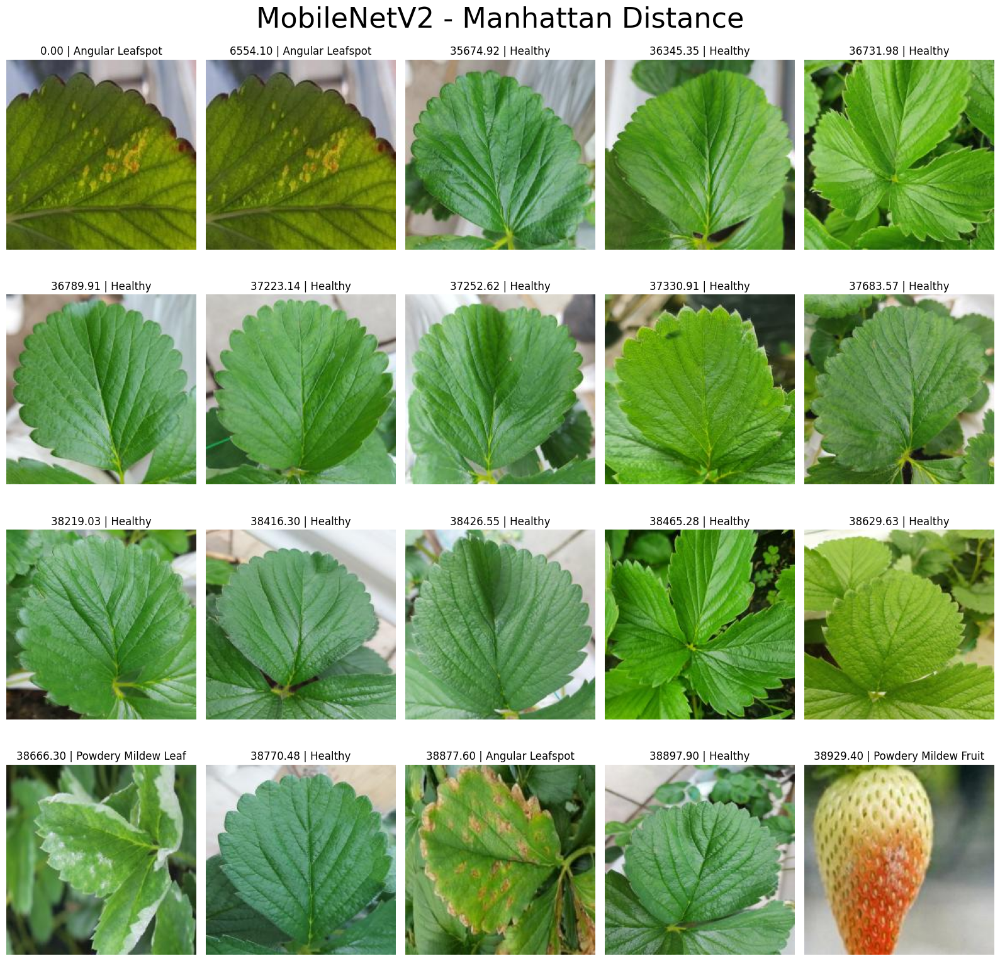

In [25]:
import os
import matplotlib.pyplot as plt

plt.figure(figsize=(16, 16))
for i in range(min(20, len(result_manhattan))):  # jaga-jaga kalau hasilnya < 20
    distance = result_manhattan[i][0]
    label = os.path.basename(os.path.dirname(result_manhattan[i][1]))

    plt.subplot(4, 5, i + 1)
    plt.title(f"{distance:.2f} | {label}")
    plt.imshow(plt.imread(result_manhattan[i][1]))
    plt.axis('off')

plt.suptitle(f"{model_name} - Manhattan Distance", fontsize=32)
plt.tight_layout()
plt.show()


In [30]:
import os
import numpy as np
from scipy.spatial.distance import cosine # Make sure this is imported

result_cosine = []
# Use valid_paths for iteration as it correctly corresponds to the features list
for i in range(len(features)): # Loop based on the length of 'features'
    # Flatten query_features and features[i] as cosine expects 1D arrays
    distance = cosine(query_features.flatten(), features[i].flatten())
    result_cosine.append((distance, valid_paths[i])) # Use valid_paths here

result_cosine = sorted(result_cosine)

precision = []
hit = 0
i = 1
for distance, file_path_item in result_cosine: # Renamed 'file' to 'file_path_item'
    # Your improved label extraction using os.path is robust and correct
    label = os.path.basename(os.path.dirname(file_path_item))
    if query_label.lower() == label.lower():
        hit += 1
        precision.append(hit / i)
    i += 1

if precision:
    print(f"\nCosine Average Precision: {np.mean(precision):.3f}")
else:
    print("No relevant items found. Average Precision = 0.000")


Cosine Average Precision: 0.255


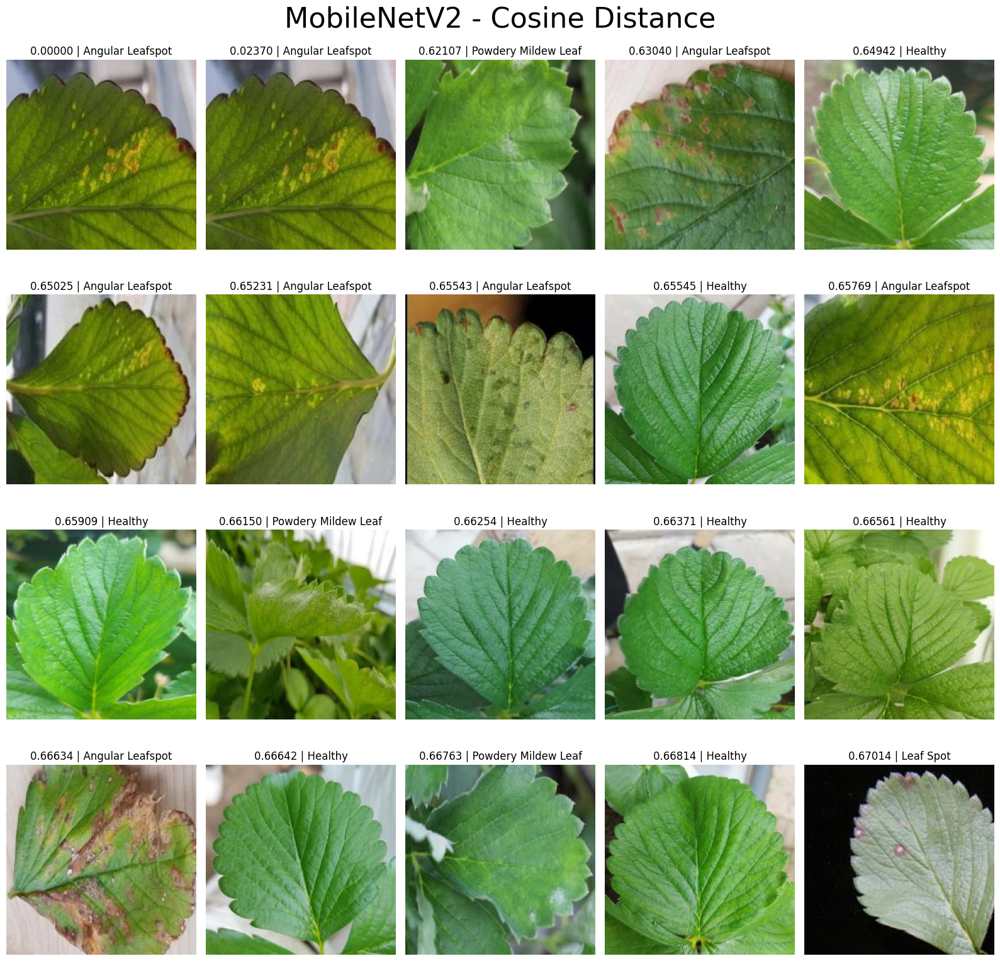

In [32]:
import os
import matplotlib.pyplot as plt

plt.figure(figsize=(16, 16))
for i in range(min(20, len(result_cosine))):  # antisipasi jika < 20 hasil
    distance = result_cosine[i][0]
    label = os.path.basename(os.path.dirname(result_cosine[i][1]))

    plt.subplot(4, 5, i + 1)
    plt.title(f"{distance:.5f} | {label}")
    plt.imshow(plt.imread(result_cosine[i][1]))
    plt.axis("off")

plt.suptitle(f"{model_name} - Cosine Distance", fontsize=32)
plt.tight_layout()
plt.show()


In [36]:
import os
import numpy as np
from scipy.spatial.distance import minkowski # Make sure this is imported

result_minkowski = []
# Use valid_paths for iteration as it correctly corresponds to the features list
for i in range(len(features)): # Loop based on the length of 'features'
    # Flatten query_features and features[i] as minkowski expects 1D arrays
    # You also need to specify the 'p' parameter for minkowski distance,
    # e.g., p=1 for Manhattan, p=2 for Euclidean.
    # If not specified, default p=2 (Euclidean) is used.
    # Assuming you want a different p than 2 (which is covered by euclidean already),
    # let's use p=3 as an example, you can change this.
    distance = minkowski(query_features.flatten(), features[i].flatten(), p=3)
    result_minkowski.append((distance, valid_paths[i])) # Use valid_paths here

result_minkowski = sorted(result_minkowski)

precision = []
hit = 0
i = 1
for distance, file_path_item in result_minkowski: # Renamed 'file' to 'file_path_item'
    # Use the robust os.path method for label extraction
    label = os.path.basename(os.path.dirname(file_path_item))
    if query_label.lower() == label.lower():
        hit += 1
        # The common practice for precision is hit/i, not hit/(i+1)
        precision.append(hit / i)
    i += 1

if precision:
    print(f"\nMinkowski Average Precision: {np.mean(precision):.3f}")
else:
    print("No relevant items found. Average Precision = 0.000")


Minkowski Average Precision: 0.154


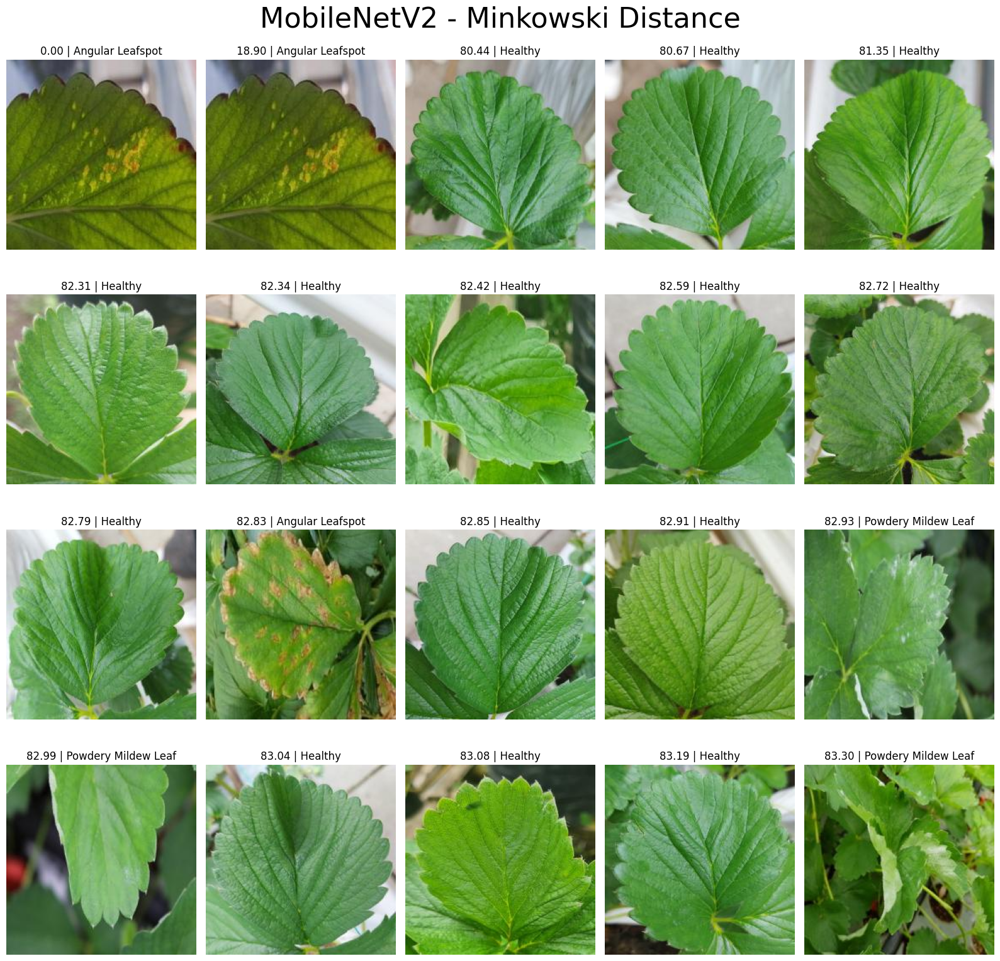

In [38]:
import os
import matplotlib.pyplot as plt

plt.figure(figsize=(16, 16))
for i in range(min(20, len(result_minkowski))):  # aman jika < 20 hasil
    distance = result_minkowski[i][0]
    label = os.path.basename(os.path.dirname(result_minkowski[i][1]))

    plt.subplot(4, 5, i + 1)
    plt.title(f"{distance:.2f} | {label}")
    plt.imshow(plt.imread(result_minkowski[i][1]))
    plt.axis("off")

plt.suptitle(f"{model_name} - Minkowski Distance", fontsize=32)
plt.tight_layout()
plt.show()


# UI with Tkinter

In [40]:
class ImageRetrievalApp:
    def __init__(self, root):
        self.root = root
        self.root.title("Strawberry Image Retrieval App")
        self.root.geometry("1100x550")  # (W x H)

        self.query_image_path = None
        self.query_features = None  # Store query features
        self.current_distance_metric = tk.StringVar(value="euclidean")
        self.current_distance_metric.trace('w', self.on_metric_change)  # Add trace for metric changes
        self.top_k = tk.IntVar(value=20)
        self.top_k.trace('w', self.on_metric_change)  # Also update when K changes

        self.setup_ui()
        self.load_config()

    def setup_ui(self):
        # Main container
        main_container = ttk.Frame(self.root)
        main_container.pack(fill=tk.BOTH, expand=True, padx=20, pady=20)

        # Left panel for controls
        left_panel = ttk.LabelFrame(main_container, text="Controls")
        left_panel.pack(side=tk.LEFT, fill=tk.Y, padx=(0, 20))

        # Browse button
        self.browse_button = ttk.Button(left_panel, text="Browse Image", command=self.browse_image)
        self.browse_button.pack(pady=10, padx=10, fill=tk.X)

        # Distance metric selection
        ttk.Label(left_panel, text="Distance Metric:").pack(pady=(10, 5), padx=10)
        metrics = ["euclidean", "manhattan", "cosine", "minkowski"]
        for metric in metrics:
            ttk.Radiobutton(
                left_panel,
                text=metric.capitalize(),
                variable=self.current_distance_metric,
                value=metric
            ).pack(pady=2, padx=10)

        # Top-K selection
        ttk.Label(left_panel, text="Number of Results (K):").pack(pady=(10, 5), padx=10)
        top_k_entry = ttk.Entry(left_panel, textvariable=self.top_k)
        top_k_entry.pack(pady=(0, 10), padx=10)

        # Query image frame
        query_frame = ttk.LabelFrame(main_container, text="Query Image")
        query_frame.pack(side=tk.LEFT, fill=tk.BOTH, padx=(0, 20))

        self.query_image_label = ttk.Label(query_frame, text="Query Image will be displayed here")
        self.query_image_label.pack(padx=10, pady=10)

        # Right panel for results
        right_panel = ttk.LabelFrame(main_container, text="Retrieved Images")
        right_panel.pack(side=tk.LEFT, fill=tk.BOTH, expand=True)

        # Canvas for scrollable results
        self.canvas = tk.Canvas(right_panel)
        scrollbar = ttk.Scrollbar(right_panel, orient=tk.VERTICAL, command=self.canvas.yview)
        self.results_frame = ttk.Frame(self.canvas)

        self.canvas.configure(yscrollcommand=scrollbar.set)

        scrollbar.pack(side=tk.RIGHT, fill=tk.Y)
        self.canvas.pack(side=tk.LEFT, fill=tk.BOTH, expand=True)

        self.canvas.create_window((0, 0), window=self.results_frame, anchor=tk.NW)
        self.results_frame.bind("<Configure>", self._on_frame_configure)

        # Progress bar with custom style
        self.progress_frame = ttk.Frame(self.root)
        self.progress_frame.pack(fill=tk.X, padx=20, pady=(0, 20))

        # Create custom style for green progress bar
        style = ttk.Style()
        style.configure("Green.Horizontal.TProgressbar",
                       background='green',
                       troughcolor='light gray')

        self.progress = ttk.Progressbar(
            self.progress_frame,
            orient=tk.HORIZONTAL,
            length=300,
            mode='determinate',
            style="Green.Horizontal.TProgressbar"  # Apply green style
        )
        self.progress.pack(side=tk.LEFT, fill=tk.X, expand=True)

        self.progress_label = ttk.Label(self.progress_frame, text="0%")
        self.progress_label.pack(side=tk.LEFT, padx=(10, 0))

        # Status bar
        self.status_var = tk.StringVar(value="Ready")
        self.status_bar = ttk.Label(
            self.root,
            textvariable=self.status_var,
            relief=tk.SUNKEN,
            anchor=tk.W
        )
        self.status_bar.pack(fill=tk.X, padx=5, pady=5)

    def on_metric_change(self, *args):
        """Called when distance metric or K value changes"""
        if self.query_features is not None:  # Only update if we have a query image
            self.status_var.set("Updating results with new metric...")
            threading.Thread(target=self.display_retrieved_images, daemon=True).start()

    def load_config(self):
        try:
            with open('config.json', 'r') as f:
                config = json.load(f)
                self.last_directory = config.get('last_directory', os.getcwd())
        except FileNotFoundError:
            self.last_directory = os.getcwd()

    def save_config(self):
        config = {
            'last_directory': self.last_directory
        }
        with open('config.json', 'w') as f:
            json.dump(config, f)

    def _on_frame_configure(self, event=None):
        self.canvas.configure(scrollregion=self.canvas.bbox("all"))

    def browse_image(self):
        try:
            self.query_image_path = filedialog.askopenfilename(
                initialdir=self.last_directory,
                filetypes=[("Image files", "*.jpg *.jpeg *.png *.bmp")]
            )
            if self.query_image_path:
                self.last_directory = str(Path(self.query_image_path).parent)
                self.save_config()
                self.display_query_image()
                # Extract features when loading new image
                self.query_features = extract_features(self.query_image_path)
                self.status_var.set("Processing image...")
                threading.Thread(target=self.display_retrieved_images, daemon=True).start()
        except Exception as e:
            messagebox.showerror("Error", f"Error loading image: {str(e)}")
            self.query_features = None

    def display_query_image(self):
        try:
            query_img = Image.open(self.query_image_path)
            query_img.thumbnail((200, 300))
            query_img_tk = ImageTk.PhotoImage(query_img)

            self.query_image_label.configure(image=query_img_tk, text="")
            self.query_image_label.image = query_img_tk
        except Exception as e:
            messagebox.showerror("Error", f"Error displaying query image: {str(e)}")

    def update_progress(self, current, total):
        progress = (current / total) * 100
        self.progress['value'] = progress
        self.progress_label.configure(text=f"{progress:.1f}%")
        self.root.update_idletasks()

    def calculate_similarity(self, query_features, database_features):
        metric = self.current_distance_metric.get()
        if metric == "euclidean":
            return euclidean_distances(query_features.reshape(1, -1), database_features)
        elif metric == "manhattan":
            return manhattan_distances(query_features.reshape(1, -1), database_features)
        elif metric == "cosine":
            return cosine_distances(query_features.reshape(1, -1), database_features)
        elif metric == "minkowski":
            return pairwise_distances(query_features.reshape(1, -1), database_features, metric='minkowski', p=3)

    def display_retrieved_images(self):
        if self.query_features is None:
            self.status_var.set("No query image selected")
            return

        try:
            for widget in self.results_frame.winfo_children():
                widget.destroy()

            # Reset progress
            self.progress['value'] = 0
            self.progress_label.configure(text="0%")

            database_images = np.load("StrawberryFiles.npy")
            database_features = np.load("StrawberryFeatures_MobileNetV2.npy")

            similarities = self.calculate_similarity(self.query_features, database_features)
            top_k = min(self.top_k.get(), len(database_images))
            top_k_indices = np.argsort(similarities.ravel())[:top_k]

            retrieved_images = [database_images[i] for i in top_k_indices]
            retrieved_similarities = [similarities.ravel()[i] for i in top_k_indices]

            query_label = Path(self.query_image_path).parent.name
            accuracy = 0

            for i, (image_path, similarity) in enumerate(zip(retrieved_images, retrieved_similarities)):
                self.update_progress(i + 1, len(retrieved_images))

                img = Image.open(image_path)
                img.thumbnail((100, 150))
                img_tk = ImageTk.PhotoImage(img)

                result_frame = ttk.Frame(self.results_frame)
                result_frame.grid(row=i // 5, column=i % 5, padx=10, pady=5, sticky="nsew")

                label_img = ttk.Label(result_frame, image=img_tk)
                label_img.image = img_tk
                label_img.pack()

                retrieval_label = Path(image_path).parent.name
                if query_label == retrieval_label:
                    accuracy += 1

                similarity_text = f"Similarity: {similarity:.4f}\nLabel: {retrieval_label}"
                label_text = ttk.Label(
                    result_frame,
                    text=similarity_text,
                    justify=tk.CENTER,
                    wraplength=100
                )
                label_text.pack(pady=(5, 0))

            accuracy_percentage = (accuracy / len(retrieved_images)) * 100
            accuracy_label = ttk.Label(
                self.results_frame,
                text=f"Retrieval Accuracy: {accuracy_percentage:.1f}%",
                font=('Arial', 10, 'bold')
            )
            accuracy_label.grid(row=(len(retrieved_images) // 5) + 1, column=0, columnspan=5, pady=10)

            self.status_var.set(f"Retrieved {len(retrieved_images)} images with {accuracy_percentage:.1f}% accuracy")

        except Exception as e:
            messagebox.showerror("Error", f"Error retrieving images: {str(e)}")
            self.status_var.set("Error occurred during retrieval")


if __name__ == "__main__":
    try:
        root = tk.Tk()
        root.option_add('*tearOff', False)  # Disable tearoff menus
        style = ttk.Style()
        style.theme_use('clam')  # Or any other available theme

        app = ImageRetrievalApp(root)
        root.mainloop()
    except Exception as e:
        messagebox.showerror("Fatal Error", f"Application failed to start: {str(e)}")

RuntimeError: No master specified and tkinter is configured to not support default root